In [0]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import re
import time
import warnings
import numpy as np
from nltk.corpus import stopwords
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
import seaborn as sns
from sklearn.linear_model import SGDClassifier

from collections import Counter
from scipy.sparse import hstack
from sklearn.multiclass import OneVsRestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import train_test_split

from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
#Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

In [2]:
from google.colab import files
files.upload()

Saving hm_test.csv to hm_test.csv
Saving hm_train.csv to hm_train.csv


{'hm_test.csv': b'hmid,reflection_period,cleaned_hm,num_sentence\r\n88305,3m,I spent the weekend in Chicago with my friends.,1\r\n88306,3m,We moved back into our house after a remodel. We had lived in a hotel for 9 months due to our home being severely damaged in a tornado. ,2\r\n88307,3m,My fiance proposed to me in front of my family in the beginning of March.,1\r\n88308,3m,I ate lobster at a fancy restaurant with some friends.,1\r\n88309,3m,"I went out to a nice restaurant on a date with my wife. It was a very popular restaurant and we could not get a reservation. But I have a friend who owns a famous hamburger place next door to this restaurant. He was able to get us a table! We had a great table, great service, great food, and they even comped most of our dinner, so we paid almost nothing! ",5\r\n88310,3m,The Leftovers came back on TV.,1\r\n88311,3m,I had a very successful training at work the led to some important people taking notice and me getting a lot of praise for my work.,1\

In [0]:
train = pd.read_csv("hm_train.csv")
test = pd.read_csv("hm_test.csv")

# [2] Exploratory Data Analysis

In [99]:
train.head(2)

,hmid,reflection_period,cleaned_hm,num_sentence,predicted_category
0,27673,24h,I went on a successful date with someone I fel...,1,affection
1,27674,24h,I was happy when my son got 90% marks in his e...,1,affection


In [100]:
test.head(2)

,hmid,reflection_period,cleaned_hm,num_sentence
0,88305,3m,I spent the weekend in Chicago with my friends.,1
1,88306,3m,We moved back into our house after a remodel. ...,2


In [101]:
print('Shape of train data :', train.shape)
print('Shape of test data :', test.shape)

Shape of train data : (60321, 5)
Shape of test data : (40213, 4)


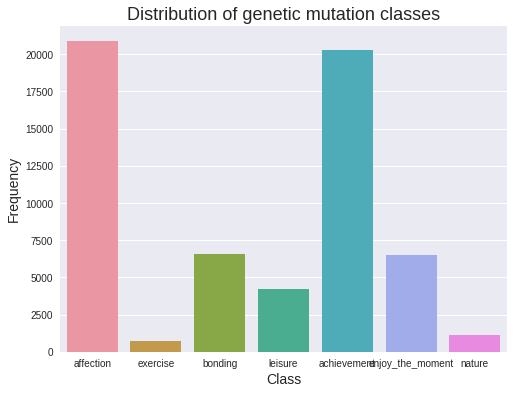

In [102]:
plt.figure(figsize=(8,6))
sns.countplot(x="predicted_category", data=train)
plt.ylabel('Frequency', fontsize=14)
plt.xlabel('Class', fontsize=14)
plt.title("Distribution of genetic mutation classes", fontsize=18)
plt.show()

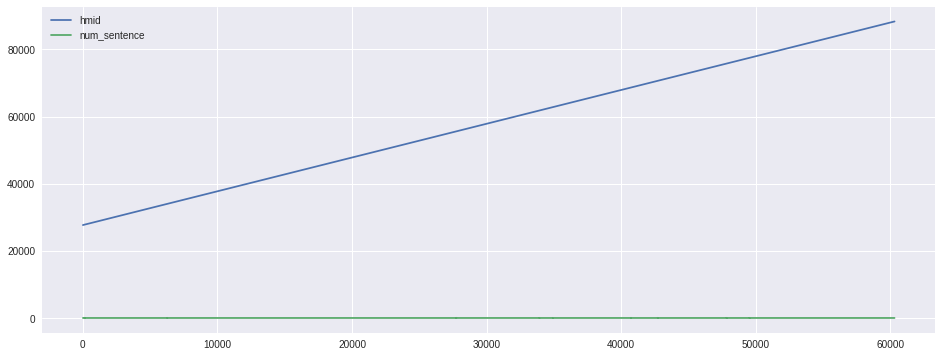

In [103]:
train.plot(figsize = (16,6))

## [2.1] Univariate Analysis

### [2.1.1] Univariate Analysis of num_sentence

In [104]:
unique_category = train['num_sentence'].value_counts()
print('Number of Unique category :', unique_category.shape[0])
# the top 10 that occured most
print(unique_category.head(10))

Number of Unique category : 41
1     49777
2      6030
3      2331
4      1047
5       493
6       215
7       125
8        73
10       41
9        37
Name: num_sentence, dtype: int64


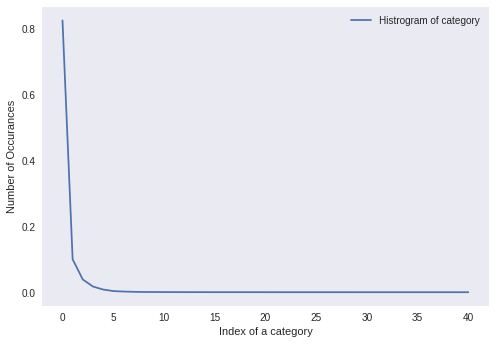

In [105]:
s = sum(unique_category.values);
h = unique_category.values/s;
plt.plot(h, label="Histrogram of category")
plt.xlabel('Index of a category')
plt.ylabel('Number of Occurances')
plt.legend()
plt.grid()
plt.show()

### [2.1.2] Univariate Analysis of predicted_category

In [106]:
unique_category = train['predicted_category'].value_counts()
print('Number of Unique category :', unique_category.shape[0])
# the top 10 that occured most
print(unique_category.head(10))

Number of Unique category : 7
affection           20880
achievement         20274
bonding              6561
enjoy_the_moment     6508
leisure              4242
nature               1127
exercise              729
Name: predicted_category, dtype: int64


In [107]:
print("Ans: There are", unique_category.shape[0] ,"different categories of category in the train data, and they are distibuted as follows",)

Ans: There are 7 different categories of category in the train data, and they are distibuted as follows


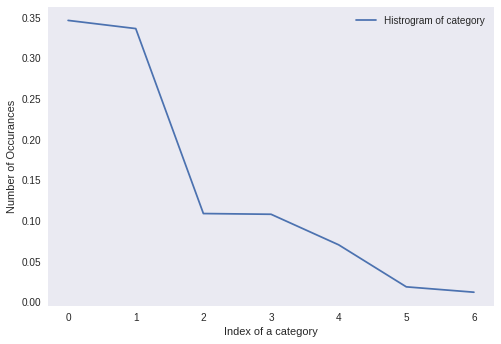

In [108]:
s = sum(unique_category.values);
h = unique_category.values/s;
plt.plot(h, label="Histrogram of category")
plt.xlabel('Index of a category')
plt.ylabel('Number of Occurances')
plt.legend()
plt.grid()
plt.show()

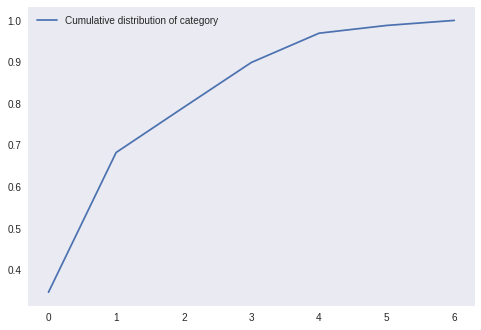

In [109]:
c = np.cumsum(h)
plt.plot(c,label='Cumulative distribution of category')
plt.grid()
plt.legend()
plt.show()

## Observation:-

1. ** The data is imbalanced**
2. ** First four categories cover more than 95% of the data**
3. ** Because other than cleaned_hm feature no other feature has some insight about the data we will move ahed with cleaned_hm feature **

## [3]Preprocessing

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re
from bs4 import BeautifulSoup

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [143]:
from tqdm import tqdm
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(train['cleaned_hm'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████| 60321/60321 [00:15<00:00, 3790.99it/s]


In [0]:
train['preprocessed_hm'] = preprocessed_reviews

In [145]:
from tqdm import tqdm
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(test['cleaned_hm'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████| 40213/40213 [00:10<00:00, 3840.41it/s]


In [0]:
test['preprocessed_hm'] = preprocessed_reviews

In [0]:
# For deeplearning

dff = train[['hmid', 'reflection_period', 'cleaned_hm', 'num_sentence','predicted_category', 'preprocessed_hm']]

In [219]:
train.head()

,hmid,reflection_period,cleaned_hm,num_sentence,predicted_category,preprocessed_hm
0,27673,24h,I went on a successful date with someone I fel...,1,affection,went successful date someone felt sympathy con...
1,27674,24h,I was happy when my son got 90% marks in his e...,1,affection,happy son got marks examination
2,27675,24h,I went to the gym this morning and did yoga.,1,exercise,went gym morning yoga
3,27676,24h,We had a serious talk with some friends of our...,2,bonding,serious talk friends flaky lately understood g...
4,27677,24h,I went with grandchildren to butterfly display...,1,affection,went grandchildren butterfly display crohn con...


In [42]:
test.head()

,hmid,reflection_period,cleaned_hm,num_sentence,preprocessed_hm
0,88305,3m,I spent the weekend in Chicago with my friends.,1,spent weekend chicago friends
1,88306,3m,We moved back into our house after a remodel. ...,2,moved back house remodel lived hotel months du...
2,88307,3m,My fiance proposed to me in front of my family...,1,fiance proposed front family beginning march
3,88308,3m,I ate lobster at a fancy restaurant with some ...,1,ate lobster fancy restaurant friends
4,88309,3m,I went out to a nice restaurant on a date with...,5,went nice restaurant date wife popular restaur...


## [4] Test, Train and Cross Validation Split

In [0]:
# mapping label values to dummy values
final = train
final['predicted_category'] = final['predicted_category'].map({'affection': '1',
                                                               'achievement': '2', 
                                                               'bonding': '3', 
                                                               'enjoy_the_moment': '4', 
                                                               'leisure': '5', 
                                                               'nature': '6',
                                                               'exercise': '7'})
                                       


In [0]:
#Splitting data into train, test and cross validation (64:20:16)
y_true = final['predicted_category'].values

# split the data into test and train by maintaining same distribution of output varaible 'y_true' [stratify=y_true]
X_train, test_df, y_train, y_test = train_test_split(final, y_true, stratify=y_true, test_size=0.2)
# split the train data into train and cross validation by maintaining same distribution of output varaible 'y_train' [stratify=y_train]
train_df, cv_df, y_train, y_cv = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2)

In [123]:
print('Number of data points in train data:', train_df.shape[0])
print('Number of data points in test data:', test_df.shape[0])
print('Number of data points in cross validation data:', cv_df.shape[0])

Number of data points in train data: 38604
Number of data points in test data: 12065
Number of data points in cross validation data: 9652


### [4.1] Distribution of y_i's in Train, Test and Cross Validation datasets

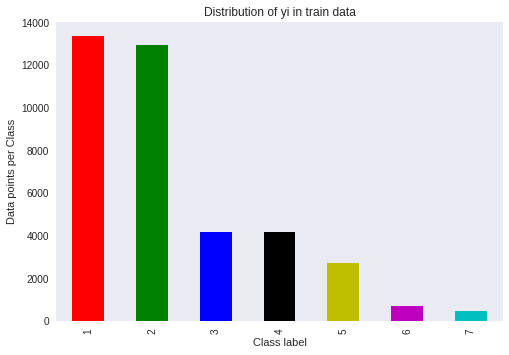

Number of data points in class 1 : 13363 ( 34.616 %)
Number of data points in class 2 : 12975 ( 33.611 %)
Number of data points in class 3 : 4199 ( 10.877 %)
Number of data points in class 4 : 4165 ( 10.789 %)
Number of data points in class 5 : 2714 ( 7.03 %)
Number of data points in class 6 : 722 ( 1.87 %)
Number of data points in class 7 : 466 ( 1.207 %)
--------------------------------------------------------------------------------


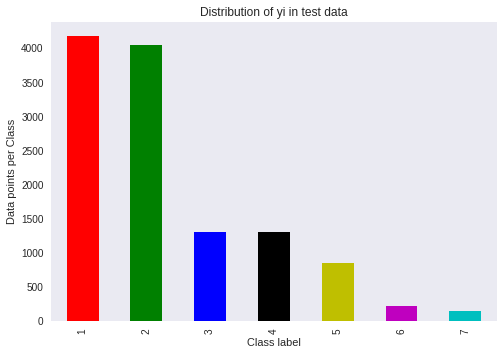

Number of data points in class 1 : 4176 ( 34.613 %)
Number of data points in class 2 : 4055 ( 33.61 %)
Number of data points in class 3 : 1312 ( 10.874 %)
Number of data points in class 4 : 1302 ( 10.792 %)
Number of data points in class 5 : 849 ( 7.037 %)
Number of data points in class 6 : 225 ( 1.865 %)
Number of data points in class 7 : 146 ( 1.21 %)
--------------------------------------------------------------------------------


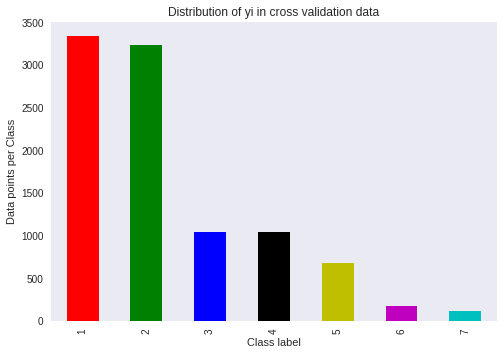

Number of data points in class 1 : 3341 ( 34.615 %)
Number of data points in class 2 : 3244 ( 33.61 %)
Number of data points in class 3 : 1050 ( 10.879 %)
Number of data points in class 4 : 1041 ( 10.785 %)
Number of data points in class 5 : 679 ( 7.035 %)
Number of data points in class 6 : 180 ( 1.865 %)
Number of data points in class 7 : 117 ( 1.212 %)


In [124]:
# it returns a dict, keys as class labels and values as the number of data points in that class
train_class_distribution = train_df['predicted_category'].value_counts().sortlevel()
test_class_distribution = test_df['predicted_category'].value_counts().sortlevel()
cv_class_distribution = cv_df['predicted_category'].value_counts().sortlevel()

my_colors = 'r', 'g', 'b', 'k', 'y', 'm', 'c'
train_class_distribution.plot(kind='bar', color=my_colors)
plt.xlabel('Class label')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in train data')
plt.grid()
plt.show()

# ref: argsort https://docs.scipy.org/doc/numpy/reference/generated/numpy.argsort.html
sorted_yi = np.argsort(-train_class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',train_class_distribution.values[i], '(', np.round((train_class_distribution.values[i]/train_df.shape[0]*100), 3), '%)')

    
print('-'*80)
my_colors = 'r', 'g', 'b', 'k', 'y', 'm', 'c'
test_class_distribution.plot(kind='bar', color=my_colors)
plt.xlabel('Class label')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in test data')
plt.grid()
plt.show()

sorted_yi = np.argsort(-test_class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',test_class_distribution.values[i], '(', np.round((test_class_distribution.values[i]/test_df.shape[0]*100), 3), '%)')

print('-'*80)
my_colors = 'r', 'g', 'b', 'k', 'y', 'm', 'c'
cv_class_distribution.plot(kind='bar', color=my_colors)
plt.xlabel('Class label')
plt.ylabel('Data points per Class')
plt.title('Distribution of yi in cross validation data')
plt.grid()
plt.show()

sorted_yi = np.argsort(-train_class_distribution.values)
for i in sorted_yi:
    print('Number of data points in class', i+1, ':',cv_class_distribution.values[i], '(', np.round((cv_class_distribution.values[i]/cv_df.shape[0]*100), 3), '%)')


## [5] Featurization of preprocessed_hm

In [247]:
# building a CountVectorizer with all the words in train data
description_vectorizer = CountVectorizer()
train_description_feature_onehotCoding = description_vectorizer.fit_transform(train_df['preprocessed_hm'])
# getting all the feature names (words)
train_description_features= description_vectorizer.get_feature_names()

# train_text_feature_onehotCoding.sum(axis=0).A1 will sum every row and returns (1*number of features) vector
train_description_fea_counts = train_description_feature_onehotCoding.sum(axis=0).A1

# zip(list(text_features),text_fea_counts) will zip a word with its number of times it occured
description_fea_dict = dict(zip(list(train_description_features),train_description_fea_counts))


print("Total number of unique words in train data :", len(train_description_features))

Total number of unique words in train data : 16661


In [0]:
# normalize feature
train_description_feature_onehotCoding = normalize(train_description_feature_onehotCoding, axis=0)

# we use the same vectorizer that was trained on train data
test_description_feature_onehotCoding = description_vectorizer.transform(test_df['preprocessed_hm'])
# normalize feature
test_description_feature_onehotCoding = normalize(test_description_feature_onehotCoding, axis=0)

# we use the same vectorizer that was trained on train data
cv_description_feature_onehotCoding = description_vectorizer.transform(cv_df['preprocessed_hm'])
# normalize feature
cv_description_feature_onehotCoding = normalize(cv_description_feature_onehotCoding, axis=0)

In [0]:
def get_intersec_text(df):
    df_text_vec = CountVectorizer()
    df_text_fea = df_text_vec.fit_transform(final['preprocessed_hm'])
    df_text_features = df_text_vec.get_feature_names()

    df_text_fea_counts = df_text_fea.sum(axis=0).A1
    df_text_fea_dict = dict(zip(list(df_text_features),df_text_fea_counts))
    len1 = len(set(df_text_features))
    len2 = len(set(train_description_features) & set(df_text_features))
    return len1,len2

In [252]:
len1,len2 = get_intersec_text(test_df)
print(np.round((len2/len1)*100, 3), "% of word of test data appeared in train data")
len1,len2 = get_intersec_text(cv_df)
print(np.round((len2/len1)*100, 3), "% of word of Cross Validation appeared in train data")

84.062 % of word of test data appeared in train data
84.062 % of word of Cross Validation appeared in train data


In [0]:
train_x_onehotCoding = train_description_feature_onehotCoding
train_y = np.array(list(train_df['predicted_category']))

test_x_onehotCoding = test_description_feature_onehotCoding
test_y = np.array(list(test_df['predicted_category']))

cv_x_onehotCoding = cv_description_feature_onehotCoding
cv_y = np.array(list(cv_df['predicted_category']))


In [254]:
print("One hot encoding features :")
print("(number of data points * number of features) in train data = ", train_x_onehotCoding.shape)
print("(number of data points * number of features) in test data = ", test_x_onehotCoding.shape)
print("(number of data points * number of features) in cross validation data =", cv_x_onehotCoding.shape)

One hot encoding features :
(number of data points * number of features) in train data =  (38604, 16661)
(number of data points * number of features) in test data =  (12065, 16661)
(number of data points * number of features) in cross validation data = (9652, 16661)


# [6] Machine Learning Models

In [0]:
# This function plots the confusion, precision and recall matrices
def plot_confusion_matrix(x_test, y_pred):
    C = confusion_matrix(x_test, y_pred)
    
    A =(((C.T)/(C.sum(axis=1))).T)
    B =(C/C.sum(axis=0))
    plt.figure(figsize=(20,4))
    
    labels = [1,2,3,4,5,6,7]
    
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap="YlGnBu", fmt="d", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()


In [0]:
#Data preparation for ML models.
def predict_and_plot_confusion_matrix(train_x, train_y,test_x, test_y, clf):
    clf.fit(train_x, train_y)
    
    pred_y = clf.predict(test_x)

    # for calculating log_loss we willl provide the array of probabilities belongs to each class
    print("Accuracy on test set: %0.3f%%"%(accuracy_score(test_y, pred_y)*100))
    print("F1-Score : %0.3f"%(f1_score(test_y, pred_y, average='weighted')))
       
    plot_confusion_matrix(test_y, pred_y)

## [6.1] Logistic Regression
### [6.1.1] With Class balancing


For values of alpha =  1e-08 The f1_score is: 0.8099798117158679
For values of alpha =  1e-07 The f1_score is: 0.8316734463948027
For values of alpha =  1e-06 The f1_score is: 0.8364069415099602
For values of alpha =  1e-05 The f1_score is: 0.8061476488422215
For values of alpha =  0.0001 The f1_score is: 0.7687709683053858
For values of alpha =  0.001 The f1_score is: 0.5166595821898076
For values of alpha =  0.01 The f1_score is: 0.20654079601074446
For values of alpha =  0.1 The f1_score is: 0.16975097465225336
For values of alpha =  1 The f1_score is: 0.16931081659641556
For values of alpha =  10 The f1_score is: 0.00924719188158325


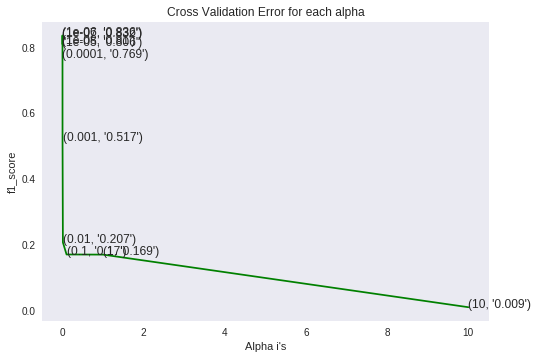

For values of best alpha =  1e-06 The train f1_score is: 0.9524649782036757
For values of best alpha =  1e-06 The cross validation f1_score is: 0.8364069415099602
For values of best alpha =  1e-06 The test f1_score is: 0.8428688732589998


In [257]:
from sklearn.metrics import accuracy_score


alpha = [10 ** x for x in range(-8, 2)] # hyperparam for SGD classifier.


score=[]
for i in alpha:
    clf = SGDClassifier(class_weight='balanced', alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    
    predict_y = clf.predict(cv_x_onehotCoding)
    score.append(f1_score(cv_y, predict_y, average='weighted'))
    print('For values of alpha = ', i, "The f1_score is:",f1_score(cv_y, predict_y, average='weighted'))
    
    
fig, ax = plt.subplots()
ax.plot(alpha, score,c='g')
for i, txt in enumerate(np.round(score,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],score[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("f1_score")
plt.show()


best_alpha = np.argmax(score)
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)


predict_y = clf.predict(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train f1_score is:",f1_score(y_train, predict_y, average='weighted'))
predict_y = clf.predict(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation f1_score is:",f1_score(y_cv, predict_y, average='weighted'))
predict_y = clf.predict(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test f1_score is:",f1_score(y_test, predict_y, average='weighted'))

Accuracy on test set: 83.206%
F1-Score : 0.836


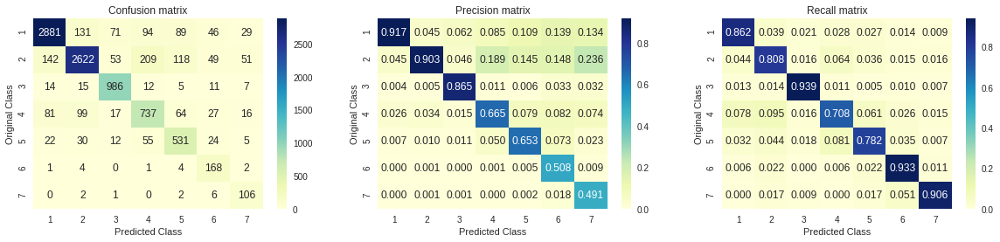

In [258]:
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
predict_and_plot_confusion_matrix(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, clf)

### [6.1.2] Without Class balancing

For values of alpha =  1e-08 The f1_score is: 0.8180110378368929
For values of alpha =  1e-07 The f1_score is: 0.8373772651361389
For values of alpha =  1e-06 The f1_score is: 0.8511635431004293
For values of alpha =  1e-05 The f1_score is: 0.7960693392244985
For values of alpha =  0.0001 The f1_score is: 0.5272271249385605
For values of alpha =  0.001 The f1_score is: 0.47365775755694817
For values of alpha =  0.01 The f1_score is: 0.17999796646659547
For values of alpha =  0.1 The f1_score is: 0.17084924246414146
For values of alpha =  1 The f1_score is: 0.16931081659641556
For values of alpha =  10 The f1_score is: 0.00924719188158325


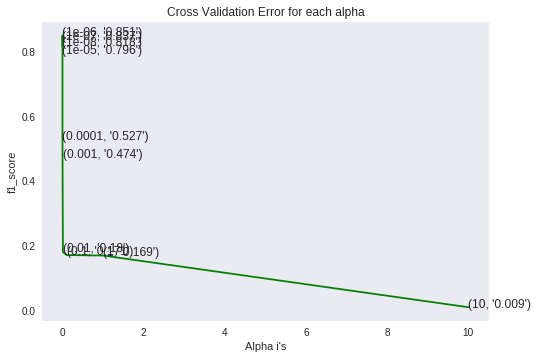

For values of best alpha =  1e-06 The train f1_score is: 0.947422966970684
For values of best alpha =  1e-06 The cross validation f1_score is: 0.8511635431004293
For values of best alpha =  1e-06 The test f1_score is: 0.8545308276681993


In [267]:
from sklearn.metrics import accuracy_score


alpha = [10 ** x for x in range(-8, 2)] # hyperparam for SGD classifier.


score=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    
    predict_y = clf.predict(cv_x_onehotCoding)
    score.append(f1_score(cv_y, predict_y, average='weighted'))
    print('For values of alpha = ', i, "The f1_score is:",f1_score(cv_y, predict_y, average='weighted'))
    
    
fig, ax = plt.subplots()
ax.plot(alpha, score,c='g')
for i, txt in enumerate(np.round(score,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],score[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("f1_score")
plt.show()


best_alpha = np.argmax(score)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)


predict_y = clf.predict(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train f1_score is:",f1_score(y_train, predict_y, average='weighted'))
predict_y = clf.predict(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation f1_score is:",f1_score(y_cv, predict_y, average='weighted'))
predict_y = clf.predict(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test f1_score is:",f1_score(y_test, predict_y, average='weighted'))

Accuracy on test set: 85.205%
F1-Score : 0.851


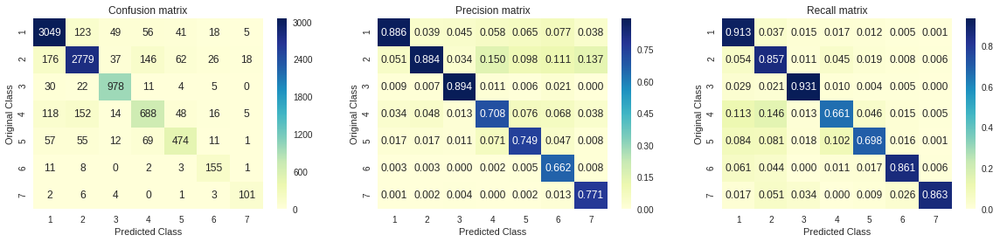

In [268]:
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
predict_and_plot_confusion_matrix(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, clf)

## [6.2] Linear Support Vector Machines
### [6.2.1] With Class balancing

For values of alpha =  1e-08 The f1_score is: 0.8078820259901122
For values of alpha =  1e-07 The f1_score is: 0.8140951757402484
For values of alpha =  1e-06 The f1_score is: 0.8312803761100845
For values of alpha =  1e-05 The f1_score is: 0.8165957289805698
For values of alpha =  0.0001 The f1_score is: 0.7681356755512627
For values of alpha =  0.001 The f1_score is: 0.7531853535937014
For values of alpha =  0.01 The f1_score is: 0.7518315596005114
For values of alpha =  0.1 The f1_score is: 0.16975097465225336
For values of alpha =  1 The f1_score is: 0.16931081659641556
For values of alpha =  10 The f1_score is: 0.00924719188158325


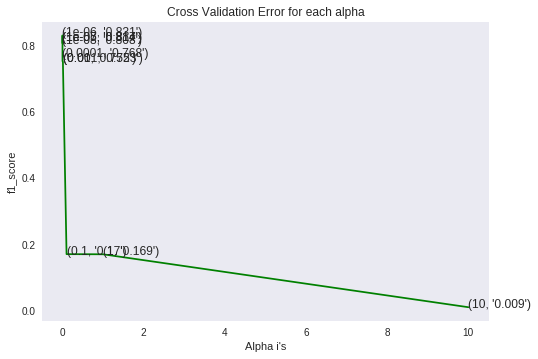

For values of best alpha =  1e-06 The train f1_score is: 0.9588265597740571
For values of best alpha =  1e-06 The cross validation f1_score is: 0.8312803761100845
For values of best alpha =  1e-06 The test f1_score is: 0.8340691463607458


In [261]:
from sklearn.metrics import accuracy_score


alpha = [10 ** x for x in range(-8, 2)] # hyperparam for SGD classifier.


score=[]
for i in alpha:
    clf = SGDClassifier(class_weight='balanced', alpha=i, penalty='l2', loss='hinge', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    
    predict_y = clf.predict(cv_x_onehotCoding)
    score.append(f1_score(cv_y, predict_y, average='weighted'))
    print('For values of alpha = ', i, "The f1_score is:",f1_score(cv_y, predict_y, average='weighted'))
    
    
fig, ax = plt.subplots()
ax.plot(alpha, score,c='g')
for i, txt in enumerate(np.round(score,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],score[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("f1_score")
plt.show()


best_alpha = np.argmax(score)
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='hinge', random_state=42)
clf.fit(train_x_onehotCoding, train_y)


predict_y = clf.predict(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train f1_score is:",f1_score(y_train, predict_y, average='weighted'))
predict_y = clf.predict(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation f1_score is:",f1_score(y_cv, predict_y, average='weighted'))
predict_y = clf.predict(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test f1_score is:",f1_score(y_test, predict_y, average='weighted'))

Accuracy on test set: 82.708%
F1-Score : 0.831


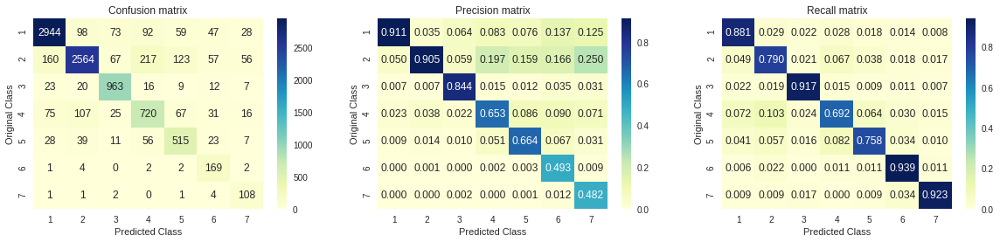

In [262]:
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='hinge', random_state=42)
predict_and_plot_confusion_matrix(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, clf)

### [6.2.2] Without Class balancing

For values of alpha =  1e-08 The f1_score is: 0.8078820259901122
For values of alpha =  1e-07 The f1_score is: 0.8140951757402484
For values of alpha =  1e-06 The f1_score is: 0.8312803761100845
For values of alpha =  1e-05 The f1_score is: 0.8165957289805698
For values of alpha =  0.0001 The f1_score is: 0.7681356755512627
For values of alpha =  0.001 The f1_score is: 0.7531853535937014
For values of alpha =  0.01 The f1_score is: 0.7518315596005114
For values of alpha =  0.1 The f1_score is: 0.16975097465225336
For values of alpha =  1 The f1_score is: 0.16931081659641556
For values of alpha =  10 The f1_score is: 0.00924719188158325


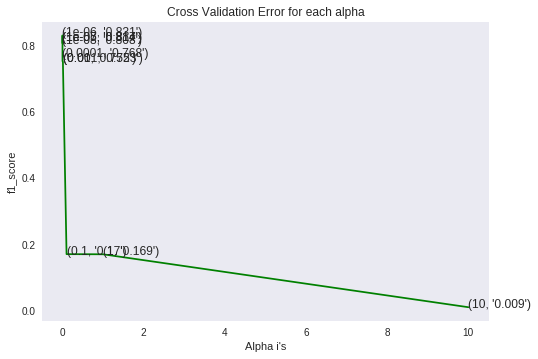

For values of best alpha =  1e-06 The train f1_score is: 0.9588265597740571
For values of best alpha =  1e-06 The cross validation f1_score is: 0.8312803761100845
For values of best alpha =  1e-06 The test f1_score is: 0.8340691463607458


In [263]:
from sklearn.metrics import accuracy_score


alpha = [10 ** x for x in range(-8, 2)] # hyperparam for SGD classifier.


score=[]
for i in alpha:
    clf = SGDClassifier(class_weight='balanced', alpha=i, penalty='l2', loss='hinge', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    
    predict_y = clf.predict(cv_x_onehotCoding)
    score.append(f1_score(cv_y, predict_y, average='weighted'))
    print('For values of alpha = ', i, "The f1_score is:",f1_score(cv_y, predict_y, average='weighted'))
    
    
fig, ax = plt.subplots()
ax.plot(alpha, score,c='g')
for i, txt in enumerate(np.round(score,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],score[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("f1_score")
plt.show()


best_alpha = np.argmax(score)
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='hinge', random_state=42)
clf.fit(train_x_onehotCoding, train_y)


predict_y = clf.predict(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train f1_score is:",f1_score(y_train, predict_y, average='weighted'))
predict_y = clf.predict(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation f1_score is:",f1_score(y_cv, predict_y, average='weighted'))
predict_y = clf.predict(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test f1_score is:",f1_score(y_test, predict_y, average='weighted'))

Accuracy on test set: 84.283%
F1-Score : 0.842


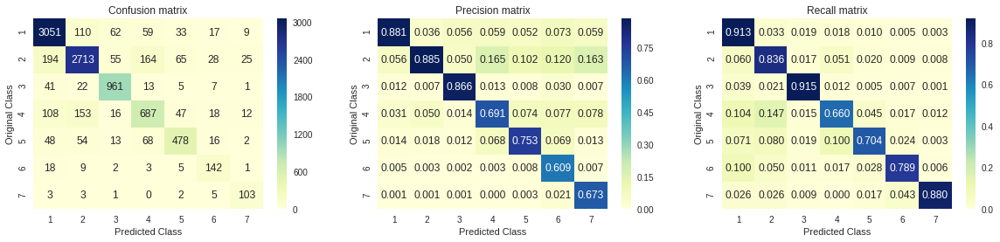

In [264]:
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='hinge', random_state=42)
predict_and_plot_confusion_matrix(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, clf)

## [6.3] Random Forest Classsifier

In [265]:
from sklearn.ensemble import RandomForestClassifier

alpha = [100,200,500,1000,2000]
max_depth = [5, 10]
score = []
for i in alpha:
    for j in max_depth:
        print("for n_estimators =", i,"and max depth = ", j)
        clf = RandomForestClassifier(n_estimators=i, criterion='gini', max_depth=j, random_state=42, n_jobs=-1)
        clf.fit(train_x_onehotCoding, train_y)
        
        predict_y = clf.predict(cv_x_onehotCoding)
        score.append(f1_score(cv_y, predict_y, average='weighted'))
        print('For values of alpha = ', i, "The accuracy is:",f1_score(cv_y, predict_y, average='weighted'))

'''fig, ax = plt.subplots()
features = np.dot(np.array(alpha)[:,None],np.array(max_depth)[None]).ravel()
ax.plot(features, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[int(i/2)],max_depth[int(i%2)],str(txt)), (features[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()
'''

best_alpha = np.argmax(score)
clf = RandomForestClassifier(n_estimators=alpha[int(best_alpha/2)], criterion='gini', max_depth=max_depth[int(best_alpha%2)], random_state=42, n_jobs=-1)
clf.fit(train_x_onehotCoding, train_y)
clf.fit(train_x_onehotCoding, train_y)

predict_y = clf.predict(train_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The train f1_score is:",f1_score(y_train, predict_y, average='weighted'))
predict_y = clf.predict(cv_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The cross validation f1_score is:",f1_score(y_cv, predict_y, average='weighted'))
predict_y = clf.predict(test_x_onehotCoding)
print('For values of best estimator = ', alpha[int(best_alpha/2)], "The test f1_score is:",f1_score(y_test, predict_y, average='weighted'))



for n_estimators = 100 and max depth =  5
For values of alpha =  100 The accuracy is: 0.49974397289734257
for n_estimators = 100 and max depth =  10
For values of alpha =  100 The accuracy is: 0.5084951896199121
for n_estimators = 200 and max depth =  5
For values of alpha =  200 The accuracy is: 0.5042277452229453
for n_estimators = 200 and max depth =  10
For values of alpha =  200 The accuracy is: 0.5098857059031501
for n_estimators = 500 and max depth =  5
For values of alpha =  500 The accuracy is: 0.5037530959273304
for n_estimators = 500 and max depth =  10
For values of alpha =  500 The accuracy is: 0.5132014273241146
for n_estimators = 1000 and max depth =  5
For values of alpha =  1000 The accuracy is: 0.5018697064188414
for n_estimators = 1000 and max depth =  10
For values of alpha =  1000 The accuracy is: 0.5136956796366953
for n_estimators = 2000 and max depth =  5
For values of alpha =  2000 The accuracy is: 0.5042675188185733
for n_estimators = 2000 and max depth =  10


Accuracy on test set: 63.448%
F1-Score : 0.516


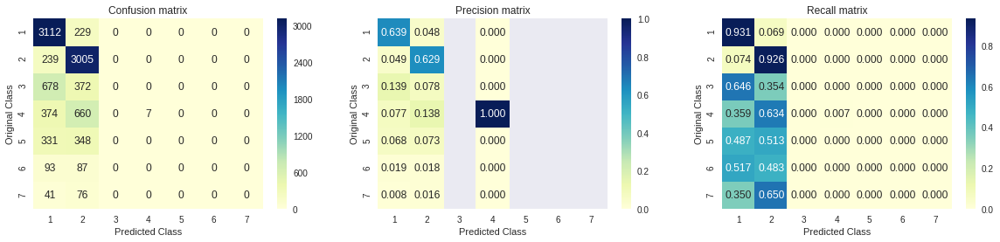

In [266]:
clf = RandomForestClassifier(n_estimators=alpha[int(best_alpha/2)], criterion='gini', max_depth=max_depth[int(best_alpha%2)], random_state=42, n_jobs=-1)
predict_and_plot_confusion_matrix(train_x_onehotCoding, train_y,cv_x_onehotCoding,cv_y, clf)



## [7] Fitting with the best model


1. **I have chosen logistic regression model(without class balancing)  **
2. ** The above model is chosen by comparing train, cv, test accuracy from performance tables beacause the model is neither overfit nor underfit**

In [0]:
X = final['preprocessed_hm']
y = final['predicted_category']

In [94]:
# building a CountVectorizer with all the words in train data
description_vectorizer = CountVectorizer()
train_description_feature_onehotCoding = description_vectorizer.fit_transform(X)
# getting all the feature names (words)
train_description_features= description_vectorizer.get_feature_names()

# train_text_feature_onehotCoding.sum(axis=0).A1 will sum every row and returns (1*number of features) vector
train_description_fea_counts = train_description_feature_onehotCoding.sum(axis=0).A1

# zip(list(text_features),text_fea_counts) will zip a word with its number of times it occured
description_fea_dict = dict(zip(list(train_description_features),train_description_fea_counts))


print("Total number of unique words in train data :", len(train_description_features))

Total number of unique words in train data : 19820


In [0]:
# normalize feature
train_description_feature_onehotCoding = normalize(train_description_feature_onehotCoding, axis=0)
# we use the same vectorizer that was trained on train data
test_description_feature_onehotCoding = description_vectorizer.transform(test['preprocessed_hm'])
# normalize feature
test_description_feature_onehotCoding = normalize(test_description_feature_onehotCoding, axis=0)

In [0]:
train_x_onehotCoding = train_description_feature_onehotCoding
train_y = np.array(list(train_df['predicted_category']))


test_x_onehotCoding = test_description_feature_onehotCoding

In [273]:
print("(number of data points * number of features) in train data = ", train_x_onehotCoding.shape)
print("(number of data points * number of features) in test data = ", test_x_onehotCoding.shape)

(number of data points * number of features) in train data =  (60321, 19820)
(number of data points * number of features) in test data =  (40213, 19820)


In [274]:
# Alpha taken from Logistic regression without class balancing 
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)

clf.fit(train_x_onehotCoding, y)

SGDClassifier(alpha=1e-06, average=False, class_weight=None,
       early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
       l1_ratio=0.15, learning_rate='optimal', loss='log', max_iter=None,
       n_iter=None, n_iter_no_change=5, n_jobs=None, penalty='l2',
       power_t=0.5, random_state=42, shuffle=True, tol=None,
       validation_fraction=0.1, verbose=0, warm_start=False)

In [0]:
pred = clf.predict(test_x_onehotCoding)

In [276]:
pred

array(['3', '1', '1', ..., '1', '2', '7'], dtype='<U1')

In [277]:
#Create a  DataFrame with the passengers ids and our prediction regarding whether they survived or not
submission = pd.DataFrame({'hmid':test['hmid'],'predicted_category':pred})

#Visualize the first 5 rows
submission.head()

,hmid,predicted_category
0,88305,3
1,88306,1
2,88307,1
3,88308,4
4,88309,1


In [0]:
# mapping label values to dummy values

submission['predicted_category'] = submission['predicted_category'].map({'1': 'affection',
                                                                         '2': 'achievement', 
                                                                         '3': 'bonding', 
                                                                         '4': 'enjoy_the_moment', 
                                                                         '5': 'leisure', 
                                                                         '6': 'nature',
                                                                         '7': 'exercise'})
                                       


In [279]:
submission.head()

,hmid,predicted_category
0,88305,bonding
1,88306,affection
2,88307,affection
3,88308,enjoy_the_moment
4,88309,affection


In [280]:
filename = 'submission.csv'

submission.to_csv(filename,index=False)

print('Saved file: ' + filename)

Saved file: submission.csv


In [0]:
from google.colab import files
files.download('submission.csv')

# Deep Neural Networks

In [51]:
import keras 
import numpy as np
from keras.preprocessing.text import Tokenizer
import numpy as np
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, Dropout, Embedding, LSTM, Flatten
from keras.models import Model
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
plt.style.use('ggplot')
%matplotlib inline
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [222]:
dff.head()

,hmid,reflection_period,cleaned_hm,num_sentence,predicted_category,preprocessed_hm
0,27673,24h,I went on a successful date with someone I fel...,1,affection,went successful date someone felt sympathy con...
1,27674,24h,I was happy when my son got 90% marks in his e...,1,affection,happy son got marks examination
2,27675,24h,I went to the gym this morning and did yoga.,1,exercise,went gym morning yoga
3,27676,24h,We had a serious talk with some friends of our...,2,bonding,serious talk friends flaky lately understood g...
4,27677,24h,I went with grandchildren to butterfly display...,1,affection,went grandchildren butterfly display crohn con...


In [0]:
data = dff[['preprocessed_hm', 'predicted_category']]

In [218]:
data.head()

,preprocessed_hm,predicted_category
0,went successful date someone felt sympathy con...,affection
1,happy son got marks examination,affection
2,went gym morning yoga,exercise
3,serious talk friends flaky lately understood g...,bonding
4,went grandchildren butterfly display crohn con...,affection


In [224]:
data['predicted_category'].value_counts()

affection           20880
achievement         20274
bonding              6561
enjoy_the_moment     6508
leisure              4242
nature               1127
exercise              729
Name: predicted_category, dtype: int64

In [0]:
# Setting the number of classes and target variable
num_class = len(np.unique(data.predicted_category.values))
y = data['predicted_category'].values

In [0]:
# Convert predicted_category to integers
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
labelencoder_y_1 = LabelEncoder()
y = labelencoder_y_1.fit_transform(data['predicted_category'])

In [0]:
# Tokenize the input
MAX_LENGTH = 50
tokenizer = Tokenizer()
tokenizer.fit_on_texts(data.preprocessed_hm.values)
post_seq = tokenizer.texts_to_sequences(data.preprocessed_hm.values)
post_seq_padded = pad_sequences(post_seq, maxlen=MAX_LENGTH)

In [0]:
X_train, X_test, y_train, y_test = train_test_split(post_seq_padded, y, test_size=0.05)

In [0]:
vocab_size = len(tokenizer.word_index) + 1

# LSTM

In [176]:
inputs = Input(shape=(MAX_LENGTH, ))
embedding_layer = Embedding(vocab_size,
                            128,
                            input_length=MAX_LENGTH)(inputs)


x = LSTM(120,return_sequences=True, dropout=0.6, recurrent_dropout=0.6)(embedding_layer)
x = LSTM(100,return_sequences=True, dropout=0.5, recurrent_dropout=0.5)(x)
x = LSTM(80,return_sequences=True, dropout=0.4, recurrent_dropout=0.4)(x)
x = LSTM(60,dropout=0.3, recurrent_dropout=0.3)(x)
x = Dense(32, activation='relu')(x)
predictions = Dense(num_class, activation='softmax')(x)
model = Model(inputs=[inputs], outputs=predictions)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['acc'])

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        (None, 50)                0         
_________________________________________________________________
embedding_19 (Embedding)     (None, 50, 128)           2539392   
_________________________________________________________________
lstm_29 (LSTM)               (None, 50, 120)           119520    
_________________________________________________________________
lstm_30 (LSTM)               (None, 50, 100)           88400     
_________________________________________________________________
lstm_31 (LSTM)               (None, 50, 80)            57920     
_________________________________________________________________
lstm_32 (LSTM)               (None, 60)                33840     
_________________________________________________________________
dense_32 (Dense)             (None, 32)                1952      
__________

In [177]:
filepath="weights.hdf5"
checkpointer = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
history = model.fit([X_train], batch_size=64, y=to_categorical(y_train), verbose=1, validation_split=0.25, 
          shuffle=True, epochs=10, callbacks=[checkpointer])

Train on 42978 samples, validate on 14326 samples
Epoch 1/10
42978/42978 [==============================] - 365s 8ms/step - loss: 1.2855 - acc: 0.4927 - val_loss: 0.8113 - val_acc: 0.6902

Epoch 00001: val_acc improved from -inf to 0.69021, saving model to weights.hdf5
Epoch 2/10
42978/42978 [==============================] - 356s 8ms/step - loss: 0.6651 - acc: 0.7709 - val_loss: 0.5695 - val_acc: 0.8032

Epoch 00002: val_acc improved from 0.69021 to 0.80322, saving model to weights.hdf5
Epoch 3/10
42978/42978 [==============================] - 353s 8ms/step - loss: 0.4992 - acc: 0.8279 - val_loss: 0.4951 - val_acc: 0.8399

Epoch 00003: val_acc improved from 0.80322 to 0.83994, saving model to weights.hdf5
Epoch 4/10
42978/42978 [==============================] - 347s 8ms/step - loss: 0.3996 - acc: 0.8690 - val_loss: 0.4347 - val_acc: 0.8596

Epoch 00004: val_acc improved from 0.83994 to 0.85956, saving model to weights.hdf5
Epoch 5/10
42978/42978 [==============================] - 334

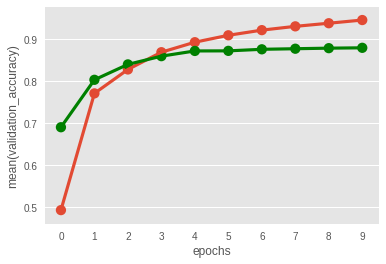

In [178]:
df = pd.DataFrame({'epochs':history.epoch, 'accuracy': history.history['acc'], 'validation_accuracy': history.history['val_acc']})
g = sns.pointplot(x="epochs", y="accuracy", data=df, fit_reg=False)
g = sns.pointplot(x="epochs", y="validation_accuracy", data=df, fit_reg=False, color='green')

In [0]:
model.load_weights('weights.hdf5')
predicted = model.predict(X_test)

In [181]:
predicted

array([[4.62158758e-04, 9.98302460e-01, 7.51991000e-04, ...,
        4.79482514e-05, 1.87505793e-04, 1.20973978e-04],
       [1.87719672e-03, 7.86400307e-03, 4.56851034e-04, ...,
        3.13055352e-04, 8.57151091e-01, 9.97998193e-03],
       [2.83532962e-03, 1.11025805e-03, 1.15115392e-04, ...,
        1.32884865e-03, 9.87807572e-01, 2.99684936e-03],
       ...,
       [1.73487130e-03, 2.73797801e-03, 9.60374475e-01, ...,
        1.18433759e-02, 3.78887006e-03, 1.65577084e-02],
       [8.74169782e-05, 9.99725282e-01, 1.17324416e-04, ...,
        6.10969073e-06, 2.46405652e-05, 1.54681566e-05],
       [1.00636762e-03, 9.98250902e-01, 3.02004715e-04, ...,
        4.32572706e-05, 1.20565775e-04, 7.67471429e-05]], dtype=float32)

In [0]:
predicted = np.argmax(predicted, axis=1)

In [183]:
accuracy_score(y_test, predicted)

0.8866423599602253

In [0]:
# Tokenize the input
MAX_LENGTH = 50
tokenizer = Tokenizer()
tokenizer.fit_on_texts(test.preprocessed_hm.values)
post_seq = tokenizer.texts_to_sequences(test.preprocessed_hm.values)
post_seq_padded = pad_sequences(post_seq, maxlen=MAX_LENGTH)

In [0]:
predictions = model.predict(post_seq_padded, verbose=0)


In [0]:
predicted = np.argmax(predictions, axis=1)

In [266]:
#Create a  DataFrame with the passengers ids and our prediction regarding whether they survived or not
submission_file = pd.DataFrame({'hmid':test['hmid'],'predicted_category':predicted})

#Visualize the first 5 rows
submission_file.head()



,hmid,predicted_category
0,88305,0
1,88306,0
2,88307,0
3,88308,3
4,88309,2


In [0]:
submission = submission_file.replace({'predicted_category' : {0:'achievement', 1:'affection', 2:'bonding', 3:'enjoy_the_moment', 4:'exercise', 5:'leisure', 6:'nature'}})

In [273]:
submission.head()

,hmid,predicted_category
0,88305,achievement
1,88306,achievement
2,88307,achievement
3,88308,enjoy_the_moment
4,88309,bonding


In [275]:
filename = 'submission.csv'

submission.to_csv(filename,index=False)

print('Saved file: ' + filename)
from google.colab import files
files.download('submission.csv')

Saved file: submission.csv


# Performance Table

In [201]:
from prettytable import PrettyTable    
x = PrettyTable()
 
x.field_names = ["FEATURIZATION", "MODEL", "TRAIN_F1_SCORE", "CV_F1_SCORE", "TEST_F1_SCORE"]
x.add_row(["", "Logistic Resgression(with Balancing)", 0.95, 0.83, 0.84])
x.add_row(["", "Logistic Resgression(without Balancing)", 0.94, 0.85, 0.85])
x.add_row(["BOW", "Linear Support Vector Machine(with Balancing)", 0.95, 0.83, 0.83])
x.add_row(["", "Linear Support Vector Machine(without Balancing)", 0.95, 0.83, 0.83])
x.add_row(["", "Random Forest", 0.52, 0.51, 0.51])


print('\t\t\t\t\tPERFORMANCE TABLE WITH BOW FEATURIZATION')
print(x)


					PERFORMANCE TABLE WITH BOW FEATURIZATION
+---------------+--------------------------------------------------+----------------+-------------+---------------+
| FEATURIZATION |                      MODEL                       | TRAIN_F1_SCORE | CV_F1_SCORE | TEST_F1_SCORE |
+---------------+--------------------------------------------------+----------------+-------------+---------------+
|               |       Logistic Resgression(with Balancing)       |      0.95      |     0.83    |      0.84     |
|               |     Logistic Resgression(without Balancing)      |      0.94      |     0.85    |      0.85     |
|      BOW      |  Linear Support Vector Machine(with Balancing)   |      0.95      |     0.83    |      0.83     |
|               | Linear Support Vector Machine(without Balancing) |      0.95      |     0.83    |      0.83     |
|               |                  Random Forest                   |      0.52      |     0.51    |      0.51     |
+---------------+---------

In [200]:
from prettytable import PrettyTable    
x = PrettyTable()
 
x.field_names = ["FEATURIZATION", "MODEL", "TRAIN_F1_SCORE", "CV_F1_SCORE", "TEST_F1_SCORE"]
x.add_row(["", "Logistic Resgression(with Balancing)", 0.99, 0.807, 0.803])
x.add_row(["", "Logistic Resgression(without Balancing)", 0.97, 0.79, 0.78])
x.add_row(["BIGRAM", "Linear Support Vector Machine(with Balancing)", 0.99, 0.79, 0.79])
x.add_row(["", "Linear Support Vector Machine(without Balancing)", 0.99, 0.79, 0.79])
x.add_row(["", "Random Forest", 0.51, 0.505, 0.509])


print('\t\t\t\t\tPERFORMANCE TABLE WITH BIGRAM FEATURIZATION')
print(x)

					PERFORMANCE TABLE WITH BIGRAM FEATURIZATION
+---------------+--------------------------------------------------+----------------+-------------+---------------+
| FEATURIZATION |                      MODEL                       | TRAIN_F1_SCORE | CV_F1_SCORE | TEST_F1_SCORE |
+---------------+--------------------------------------------------+----------------+-------------+---------------+
|               |       Logistic Resgression(with Balancing)       |      0.99      |    0.807    |     0.803     |
|               |     Logistic Resgression(without Balancing)      |      0.97      |     0.79    |      0.78     |
|     BIGRAM    |  Linear Support Vector Machine(with Balancing)   |      0.99      |     0.79    |      0.79     |
|               | Linear Support Vector Machine(without Balancing) |      0.99      |     0.79    |      0.79     |
|               |                  Random Forest                   |      0.51      |    0.505    |     0.509     |
+---------------+------

In [246]:
from prettytable import PrettyTable    
x = PrettyTable()
 
x.field_names = ["FEATURIZATION", "MODEL", "TRAIN_F1_SCORE", "CV_F1_SCORE", "TEST_F1_SCORE"]
x.add_row(["", "Logistic Resgression(with Balancing)", 0.95, 0.81, 0.82])
x.add_row(["", "Logistic Resgression(without Balancing)", 0.96, 0.83, 0.83])
x.add_row(["TF-IDF with unigram", "Linear Support Vector Machine(with Balancing)", 0.91, 0.801, 0.803])
x.add_row(["", "Linear Support Vector Machine(without Balancing)", 0.92, 0.801, 0.803])
x.add_row(["", "Random Forest", 0.51, 0.51, 0.51])


print('\t\t\t\t\tPERFORMANCE TABLE OF TFIDF WITH UNIGRAM FEATURIZATION')
print(x)


					PERFORMANCE TABLE OF TFIDF WITH UNIGRAM FEATURIZATION
+---------------------+--------------------------------------------------+----------------+-------------+---------------+
|    FEATURIZATION    |                      MODEL                       | TRAIN_F1_SCORE | CV_F1_SCORE | TEST_F1_SCORE |
+---------------------+--------------------------------------------------+----------------+-------------+---------------+
|                     |       Logistic Resgression(with Balancing)       |      0.95      |     0.81    |      0.82     |
|                     |     Logistic Resgression(without Balancing)      |      0.96      |     0.83    |      0.83     |
| TF-IDF with unigram |  Linear Support Vector Machine(with Balancing)   |      0.91      |    0.801    |     0.803     |
|                     | Linear Support Vector Machine(without Balancing) |      0.92      |    0.801    |     0.803     |
|                     |                  Random Forest                   |      0.51   

In [245]:
from prettytable import PrettyTable    
x = PrettyTable()
 
x.field_names = ["FEATURIZATION", "MODEL", "TRAIN_F1_SCORE", "CV_F1_SCORE", "TEST_F1_SCORE"]
x.add_row(["", "Logistic Resgression(with Balancing)", 0.99, 0.81, 0.809])
x.add_row(["", "Logistic Resgression(without Balancing)", 0.99, 0.803, 0.79])
x.add_row(["TF-IDF with bigram", "Linear Support Vector Machine(with Balancing)", 0.99, 0.79, 0.78])
x.add_row(["", "Linear Support Vector Machine(without Balancing)", 0.99, 0.79, 0.78])
x.add_row(["", "Random Forest", 0.51, 0.503, 0.509])


print('\t\t\t\t\tPERFORMANCE TABLE OF TFIDF WITH BIGRAM FEATURIZATION')
print(x)

					PERFORMANCE TABLE OF TFIDF WITH BIGRAM FEATURIZATION
+--------------------+--------------------------------------------------+----------------+-------------+---------------+
|   FEATURIZATION    |                      MODEL                       | TRAIN_F1_SCORE | CV_F1_SCORE | TEST_F1_SCORE |
+--------------------+--------------------------------------------------+----------------+-------------+---------------+
|                    |       Logistic Resgression(with Balancing)       |      0.99      |     0.81    |     0.809     |
|                    |     Logistic Resgression(without Balancing)      |      0.99      |    0.803    |      0.79     |
| TF-IDF with bigram |  Linear Support Vector Machine(with Balancing)   |      0.99      |     0.79    |      0.78     |
|                    | Linear Support Vector Machine(without Balancing) |      0.99      |     0.79    |      0.78     |
|                    |                  Random Forest                   |      0.51      |    0